# Monet Style Transfer with CycleGAN

**Project**: GAN Getting Started - I'm Something of a Painter Myself  
**Competition URL**: https://www.kaggle.com/competitions/gan-getting-started  
**GitHub Repository**: [INSERT YOUR GITHUB REPO URL HERE]

## Project Overview
This notebook implements a CycleGAN to transform photographs into Monet-style paintings using Kaggle's TPU v3-8 environment for accelerated training.

## 1. Problem and Data Description

### 1.1 Problem Statement
The goal of this competition is to build a Generative Adversarial Network (GAN) capable of generating 7,000-10,000 Monet-style paintings from photographs. This is an unpaired image-to-image translation task where we must learn the artistic style of Claude Monet and apply it to modern photographs without having paired training examples.

### 1.2 Dataset Description
The dataset consists of:
- **300 Monet paintings**: Authentic works by Claude Monet showcasing his impressionistic style
- **7,028 photographs**: Contemporary landscape and nature photographs
- **Image format**: 256×256 pixels, RGB color
- **Data format**: Available as both JPEG files and TFRecords for efficient loading

### 1.3 Evaluation Metric
The competition uses **MiFID (Memorization-Informed Fréchet Inception Distance)** which:
- Measures the quality and diversity of generated images
- Penalizes models that memorize training data
- Formula: `MiFID = FID / M(F_real, F_fake)`

## 2. Environment Setup and Imports

In [1]:
# TPU Detection and Setup
import tensorflow as tf
import os

# Detect TPU
try:
    #get tpu cluster resolver
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Running on TPU ', tpu.master())
except ValueError:
    tpu = None

if tpu:
    #connect tpu cluster and initialize tpu system
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    #load TPU distribution strategy
    strategy = tf.distribute.TPUStrategy(tpu)
else:
    # Default to GPU/CPU strategy
    strategy = tf.distribute.get_strategy()

print("REPLICAS: ", strategy.num_replicas_in_sync)

2025-06-21 19:32:48.959505: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1750534369.129358      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1750534369.174572      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


REPLICAS:  1


In [2]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import glob
import random
from PIL import Image
import gc

# TensorFlow imports
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
#!pip install tensorflow_addons
#import tensorflow_addons as tfa

# Set random seeds for reproducibility
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)
random.seed(SEED)

# Visualization settings
plt.style.use('seaborn-v0_8-darkgrid')
%matplotlib inline

## 3. Configuration and Hyperparameters

In [3]:
# Configuration class to store parameters
class Config:
    # Data paths - Update these for Kaggle environment
    MONET_TFREC_PATH = '/kaggle/input/gan-getting-started/monet_tfrec/*.tfrec'
    PHOTO_TFREC_PATH = '/kaggle/input/gan-getting-started/photo_tfrec/*.tfrec'
    MONET_JPG_PATH = '/kaggle/input/gan-getting-started/monet_jpg/*.jpg'
    PHOTO_JPG_PATH = '/kaggle/input/gan-getting-started/photo_jpg/*.jpg'
    
    # Model parameters
    IMG_HEIGHT = 256
    IMG_WIDTH = 256
    CHANNELS = 3
    
    # Training parameters
    BATCH_SIZE = 4 * strategy.num_replicas_in_sync  # Scale batch size with TPU replicas
    EPOCHS = 50
    STEPS_PER_EPOCH = 100
    
    # Loss weights
    LAMBDA_CYCLE = 10.0
    LAMBDA_IDENTITY = 0.5
    
    # Optimizer parameters
    LEARNING_RATE = 2e-4
    BETA_1 = 0.5
    
    # Data augmentation
    AUGMENT = True
    ROTATION_RANGE = 10
    ZOOM_RANGE = 0.1
    
    # Model architecture
    N_RESNET_BLOCKS = 8
    NGF = 64  # Number of generator filters
    NDF = 64  # Number of discriminator filters
    
    # Output
    OUTPUT_IMAGES = 10000  # Number of images to generate for submission

config = Config()
print(f"Batch size: {config.BATCH_SIZE}")
print(f"Images per epoch: {config.BATCH_SIZE * config.STEPS_PER_EPOCH}")

Batch size: 4
Images per epoch: 400


## 4. Data Loading and Preprocessing

### 4.1 TFRecord Parsing Functions

In [4]:
# Define feature description for TFRecords
IMAGE_SIZE = [config.IMG_HEIGHT, config.IMG_WIDTH]

def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image, tf.float32)
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image

def read_tfrecord(example):
    tfrecord_format = {
        "image": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

def load_dataset(filenames, batch_size, augment=False):
    """Load and prepare dataset from TFRecords"""
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=tf.data.AUTOTUNE)
    
    if augment:
        dataset = dataset.map(data_augment, num_parallel_calls=tf.data.AUTOTUNE)
    
    dataset = dataset.map(normalize_image, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(2048)
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset

def normalize_image(image):
    """Normalize images to [-1, 1]"""
    return (image / 127.5) - 1.0

def denormalize_image(image):
    """Denormalize images from [-1, 1] to [0, 1]"""
    return (image + 1.0) / 2.0

### 4.2 Data Augmentation

In [5]:
def data_augment(image):
    """Apply data augmentation to images"""
    # Random horizontal flip
    image = tf.image.random_flip_left_right(image)
    
    # Random rotation
    #image = tfa.image.rotate(image, tf.random.uniform([], -config.ROTATION_RANGE * np.pi/180, 
                                                      #config.ROTATION_RANGE * np.pi/180))
    
    # Random zoom
    scales = tf.random.uniform([1], 1 - config.ZOOM_RANGE, 1 + config.ZOOM_RANGE)
    image = tf.image.resize(image, tf.cast([config.IMG_HEIGHT * scales[0], 
                                           config.IMG_WIDTH * scales[0]], tf.int32))
    image = tf.image.resize_with_crop_or_pad(image, config.IMG_HEIGHT, config.IMG_WIDTH)
    
    return image

### 4.3 Load Datasets

In [6]:
# Get file paths
monet_files = sorted(tf.io.gfile.glob(config.MONET_TFREC_PATH))
photo_files = sorted(tf.io.gfile.glob(config.PHOTO_TFREC_PATH))

print(f"Monet TFRecord files: {len(monet_files)}")
print(f"Photo TFRecord files: {len(photo_files)}")

# Create datasets
monet_dataset = load_dataset(monet_files, config.BATCH_SIZE, augment=config.AUGMENT)
photo_dataset = load_dataset(photo_files, config.BATCH_SIZE, augment=config.AUGMENT)

# Create cycled datasets for training
monet_dataset = monet_dataset.repeat()
photo_dataset = photo_dataset.repeat()

Monet TFRecord files: 5
Photo TFRecord files: 20


I0000 00:00:1750534383.857007      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


## 5. Exploratory Data Analysis (EDA)

### 5.1 Dataset Statistics

In [7]:
# Count images in JPEG folders for verification
monet_jpg_files = tf.io.gfile.glob(config.MONET_JPG_PATH)
photo_jpg_files = tf.io.gfile.glob(config.PHOTO_JPG_PATH)

print("Dataset Statistics:")
print(f"Monet paintings: {len(monet_jpg_files)}")
print(f"Photographs: {len(photo_jpg_files)}")
print(f"Ratio (Photos:Monet): {len(photo_jpg_files)/len(monet_jpg_files):.1f}:1")
print(f"\nTotal training images: {len(monet_jpg_files) + len(photo_jpg_files)}")
print(f"Images to generate: {config.OUTPUT_IMAGES}")

Dataset Statistics:
Monet paintings: 300
Photographs: 7038
Ratio (Photos:Monet): 23.5:1

Total training images: 7338
Images to generate: 10000


### 5.2 Visualize Sample Images

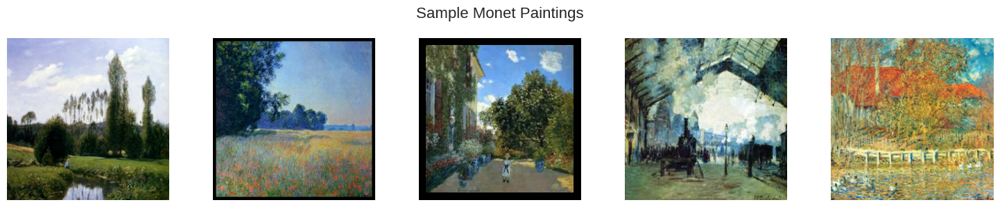

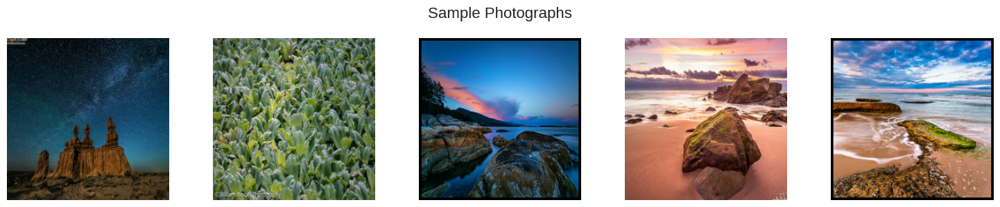

In [8]:
def visualize_samples(dataset, title, n_samples=5):
    """Visualize sample images from dataset"""
    plt.figure(figsize=(15, 3))
    
    for i, image in enumerate(dataset.take(n_samples)):
        if len(image.shape) == 4:  # Batch of images
            image = image[0]  # Take first image from batch
        
        plt.subplot(1, n_samples, i + 1)
        plt.imshow(denormalize_image(image))
        plt.axis('off')
    
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# Visualize samples
visualize_samples(monet_dataset, "Sample Monet Paintings")
visualize_samples(photo_dataset, "Sample Photographs")

### 5.3 Color Distribution Analysis

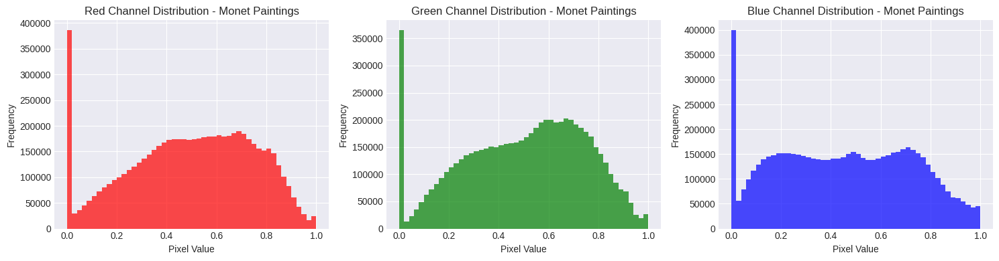

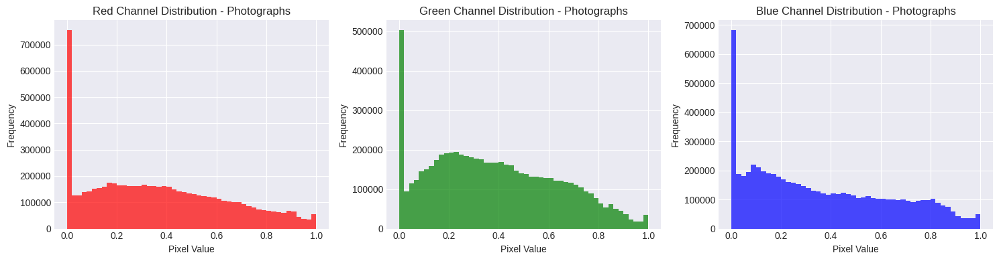

In [9]:
def analyze_color_distribution(dataset, name, n_samples=100):
    """Analyze RGB color distribution of dataset"""
    colors = []
    
    for batch in dataset.take(n_samples // config.BATCH_SIZE):
        batch_np = denormalize_image(batch).numpy()
        colors.append(batch_np.reshape(-1, 3))
    
    colors = np.concatenate(colors)
    
    # Plot histograms
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))
    color_names = ['Red', 'Green', 'Blue']
    
    for i, (ax, color) in enumerate(zip(axes, color_names)):
        ax.hist(colors[:, i], bins=50, alpha=0.7, color=color.lower())
        ax.set_title(f'{color} Channel Distribution - {name}')
        ax.set_xlabel('Pixel Value')
        ax.set_ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()
    
    return colors

# Analyze color distributions
monet_colors = analyze_color_distribution(monet_dataset, "Monet Paintings")
photo_colors = analyze_color_distribution(photo_dataset, "Photographs")

### 5.4 Style Characteristics Analysis

**TO BE COMPLETED AFTER ANALYSIS**:
- [ ] Describe the dominant color palette in Monet paintings vs photographs
- [ ] Note any specific patterns in brightness/contrast
- [ ] Identify key stylistic elements that the GAN should capture
- [ ] Discuss implications for model training

## 6. Model Architecture

### 6.1 Building Blocks

In [10]:
# Instance Normalization Layer
class InstanceNormalization(tf.keras.layers.Layer):
    def __init__(self, epsilon=1e-5):
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon

    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)

    def call(self, x):
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

# Residual Block
def residual_block(x, filters, kernel_size=3):
    """Residual block with instance normalization"""
    fx = layers.Conv2D(filters, kernel_size, padding='same')(x)
    fx = InstanceNormalization()(fx)
    fx = layers.ReLU()(fx)
    
    fx = layers.Conv2D(filters, kernel_size, padding='same')(fx)
    fx = InstanceNormalization()(fx)
    
    return layers.Add()([x, fx])

# Downsampling block
def downsample(x, filters, kernel_size=3, strides=2):
    x = layers.Conv2D(filters, kernel_size, strides=strides, padding='same')(x)
    x = InstanceNormalization()(x)
    x = layers.ReLU()(x)
    return x

# Upsampling block
def upsample(x, filters, kernel_size=3, strides=2):
    x = layers.Conv2DTranspose(filters, kernel_size, strides=strides, padding='same')(x)
    x = InstanceNormalization()(x)
    x = layers.ReLU()(x)
    return x

### 6.2 Generator Architecture (ResNet-based)

In [11]:
def build_generator(name='generator'):
    """Build ResNet-based generator for CycleGAN"""
    inputs = layers.Input(shape=[config.IMG_HEIGHT, config.IMG_WIDTH, config.CHANNELS])
    
    # Initial convolution block
    x = layers.Conv2D(config.NGF, 7, padding='same')(inputs)
    x = InstanceNormalization()(x)
    x = layers.ReLU()(x)
    
    # Downsampling
    x = downsample(x, config.NGF * 2)
    x = downsample(x, config.NGF * 4)
    
    # Residual blocks
    for _ in range(config.N_RESNET_BLOCKS):
        x = residual_block(x, config.NGF * 4)
    
    # Upsampling
    x = upsample(x, config.NGF * 2)
    x = upsample(x, config.NGF)
    
    # Output layer
    x = layers.Conv2D(config.CHANNELS, 7, padding='same')(x)
    outputs = layers.Activation('tanh')(x)
    
    return keras.Model(inputs=inputs, outputs=outputs, name=name)

### 6.3 Discriminator Architecture (PatchGAN)

In [12]:
def build_discriminator(name='discriminator'):
    """Build PatchGAN discriminator"""
    inputs = layers.Input(shape=[config.IMG_HEIGHT, config.IMG_WIDTH, config.CHANNELS])
    
    # First layer without instance norm
    x = layers.Conv2D(config.NDF, 4, strides=2, padding='same')(inputs)
    x = layers.LeakyReLU(0.2)(x)
    
    # Subsequent layers with instance norm
    x = layers.Conv2D(config.NDF * 2, 4, strides=2, padding='same')(x)
    x = InstanceNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)
    
    x = layers.Conv2D(config.NDF * 4, 4, strides=2, padding='same')(x)
    x = InstanceNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)
    
    x = layers.Conv2D(config.NDF * 8, 4, strides=1, padding='same')(x)
    x = InstanceNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)
    
    # Output layer
    outputs = layers.Conv2D(1, 4, strides=1, padding='same')(x)
    
    return keras.Model(inputs=inputs, outputs=outputs, name=name)

### 6.4 Build Models with TPU Strategy

In [13]:
with strategy.scope():
    # Generators
    gen_G = build_generator(name='generator_G')  # Photo to Monet
    gen_F = build_generator(name='generator_F')  # Monet to Photo
    
    # Discriminators
    disc_X = build_discriminator(name='discriminator_X')  # For Monet images
    disc_Y = build_discriminator(name='discriminator_Y')  # For Photo images
    
    # Optimizers
    gen_G_optimizer = keras.optimizers.Adam(config.LEARNING_RATE, beta_1=config.BETA_1)
    gen_F_optimizer = keras.optimizers.Adam(config.LEARNING_RATE, beta_1=config.BETA_1)
    disc_X_optimizer = keras.optimizers.Adam(config.LEARNING_RATE, beta_1=config.BETA_1)
    disc_Y_optimizer = keras.optimizers.Adam(config.LEARNING_RATE, beta_1=config.BETA_1)

# Print model summaries
print("Generator Architecture:")
gen_G.summary()
print("\nDiscriminator Architecture:")
disc_X.summary()

Generator Architecture:


Model: "generator_G"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 256, 256, 64)   │          9,472 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ instance_normalization    │ (None, 256, 256, 64)   │            128 │ conv2d[0][0]           │
│ (InstanceNormalization)   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu (ReLU)              │ (None, 256, 256, 64)   │              0 │ instance_normalizatio… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 128, 128, 128)  │         73,856 │ re_lu[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ instance_normalization_1  │ (None, 128, 128, 128)  │            256 │ conv2d_1[0][0]         │
│ (InstanceNormalization)   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_1 (ReLU)            │ (None, 128, 128, 128)  │              0 │ instance_normalizatio… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 64, 64, 256)    │        295,168 │ re_lu_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ instance_normalization_2  │ (None, 64, 64, 256)    │            512 │ conv2d_2[0][0]         │
│ (InstanceNormalization)   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_2 (ReLU)            │ (None, 64, 64, 256)    │              0 │ instance_normalizatio… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 64, 64, 256)    │        590,080 │ re_lu_2[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ instance_normalization_3  │ (None, 64, 64, 256)    │            512 │ conv2d_3[0][0]         │
│ (InstanceNormalization)   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_3 (ReLU)            │ (None, 64, 64, 256)    │              0 │ instance_normalizatio… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 64, 64, 256)    │        590,080 │ re_lu_3[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ instance_normalization_4  │ (None, 64, 64, 256)    │            512 │ conv2d_4[0][0]         │
│ (InstanceNormalization)   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 64, 64, 256)    │              0 │ re_lu_2[0][0],         │
│                           │                        │                │ instance_normalizatio… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)    

 Total params: 10,207,491 (38.94 MB)

 Trainable params: 10,207,491 (38.94 MB)

 Non-trainable params: 0 (0.00 B)


Discriminator Architecture:


Model: "discriminator_X"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_40 (Conv2D)                   │ (None, 128, 128, 64)        │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_41 (Conv2D)                   │ (None, 64, 64, 128)         │         131,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ instance_normalization_42            │ (None, 64, 64, 128)         │             256 │
│ (InstanceNormalization)              │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_42 (Conv2D)                   │ (None, 32, 32, 256)         │         524,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ instance_normalization_43            │ (None, 32, 32, 256)         │             512 │
│ (InstanceNormalization)              │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_43 (Conv2D)                   │ (None, 32, 32, 512)         │       2,097,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ instance_normalization_44            │ (None, 32, 32, 512)         │           1,024 │
│ (InstanceNormalization)              │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 32, 32, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_44 (Conv2D)                   │ (None, 32, 32, 1)           │           8,193 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,766,529 (10.55 MB)

 Trainable params: 2,766,529 (10.55 MB)

 Non-trainable params: 0 (0.00 B)

## 7. Loss Functions

### 7.1 Define Loss Functions

In [14]:
# Loss function for discriminators (LSGAN)
def discriminator_loss(real, generated):
    real_loss = tf.reduce_mean(tf.square(real - 1))
    generated_loss = tf.reduce_mean(tf.square(generated))
    total_loss = (real_loss + generated_loss) * 0.5
    return total_loss

# Loss function for generators (LSGAN)
def generator_loss(generated):
    return tf.reduce_mean(tf.square(generated - 1))

# Cycle consistency loss
def cycle_loss(real_image, cycled_image):
    return tf.reduce_mean(tf.abs(real_image - cycled_image))

# Identity loss
def identity_loss(real_image, same_image):
    return tf.reduce_mean(tf.abs(real_image - same_image))

## 8. Training

### 8.1 Training Step

In [15]:
@tf.function
def train_step(real_x, real_y):
    """Execute one training step"""
    with tf.GradientTape(persistent=True) as tape:
        # Generator outputs
        fake_y = gen_G(real_x, training=True)
        fake_x = gen_F(real_y, training=True)
        
        # Cycle outputs
        cycled_x = gen_F(fake_y, training=True)
        cycled_y = gen_G(fake_x, training=True)
        
        # Identity outputs
        same_x = gen_F(real_x, training=True)
        same_y = gen_G(real_y, training=True)
        
        # Discriminator outputs
        disc_real_x = disc_X(real_x, training=True)
        disc_fake_x = disc_X(fake_x, training=True)
        disc_real_y = disc_Y(real_y, training=True)
        disc_fake_y = disc_Y(fake_y, training=True)
        
        # Calculate losses
        gen_G_loss = generator_loss(disc_fake_y)
        gen_F_loss = generator_loss(disc_fake_x)
        
        total_cycle_loss = cycle_loss(real_x, cycled_x) + cycle_loss(real_y, cycled_y)
        
        total_gen_G_loss = gen_G_loss + config.LAMBDA_CYCLE * total_cycle_loss + config.LAMBDA_IDENTITY * identity_loss(real_y, same_y)
        total_gen_F_loss = gen_F_loss + config.LAMBDA_CYCLE * total_cycle_loss + config.LAMBDA_IDENTITY * identity_loss(real_x, same_x)
        
        disc_X_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_Y_loss = discriminator_loss(disc_real_y, disc_fake_y)
    
    # Calculate gradients
    gen_G_gradients = tape.gradient(total_gen_G_loss, gen_G.trainable_variables)
    gen_F_gradients = tape.gradient(total_gen_F_loss, gen_F.trainable_variables)
    disc_X_gradients = tape.gradient(disc_X_loss, disc_X.trainable_variables)
    disc_Y_gradients = tape.gradient(disc_Y_loss, disc_Y.trainable_variables)
    
    # Apply gradients
    gen_G_optimizer.apply_gradients(zip(gen_G_gradients, gen_G.trainable_variables))
    gen_F_optimizer.apply_gradients(zip(gen_F_gradients, gen_F.trainable_variables))
    disc_X_optimizer.apply_gradients(zip(disc_X_gradients, disc_X.trainable_variables))
    disc_Y_optimizer.apply_gradients(zip(disc_Y_gradients, disc_Y.trainable_variables))
    
    return {
        'gen_G_loss': total_gen_G_loss,
        'gen_F_loss': total_gen_F_loss,
        'disc_X_loss': disc_X_loss,
        'disc_Y_loss': disc_Y_loss,
        'cycle_loss': total_cycle_loss
    }

### 8.2 Training Loop

Starting training...


I0000 00:00:1750534476.432591      69 cuda_dnn.cc:529] Loaded cuDNN version 90300


Epoch 1/50, Step 0/100, Gen G: 15.4511, Gen F: 16.3037, Disc X: 1.6289, Disc Y: 1.2319
Epoch 1/50, Step 50/100, Gen G: 7.1455, Gen F: 7.1914, Disc X: 0.3697, Disc Y: 0.3294

Epoch 1 completed in 0:03:14.367125
Average losses - Gen G: 7.7636, Gen F: 7.7862, Disc X: 0.5541, Disc Y: 0.5532

Epoch 2/50, Step 0/100, Gen G: 5.9742, Gen F: 5.9655, Disc X: 0.3112, Disc Y: 0.3298
Epoch 2/50, Step 50/100, Gen G: 6.9282, Gen F: 6.9734, Disc X: 0.2763, Disc Y: 0.2711

Epoch 2 completed in 0:01:56.697258
Average losses - Gen G: 6.1407, Gen F: 6.1321, Disc X: 0.2844, Disc Y: 0.2919

Epoch 3/50, Step 0/100, Gen G: 5.6664, Gen F: 5.8009, Disc X: 0.2876, Disc Y: 0.2669
Epoch 3/50, Step 50/100, Gen G: 6.1815, Gen F: 6.1967, Disc X: 0.2322, Disc Y: 0.2153

Epoch 3 completed in 0:01:56.603386
Average losses - Gen G: 5.6937, Gen F: 5.7188, Disc X: 0.2791, Disc Y: 0.2423

Epoch 4/50, Step 0/100, Gen G: 5.7532, Gen F: 5.7051, Disc X: 0.2638, Disc Y: 0.3720
Epoch 4/50, Step 50/100, Gen G: 5.1123, Gen F: 4.890

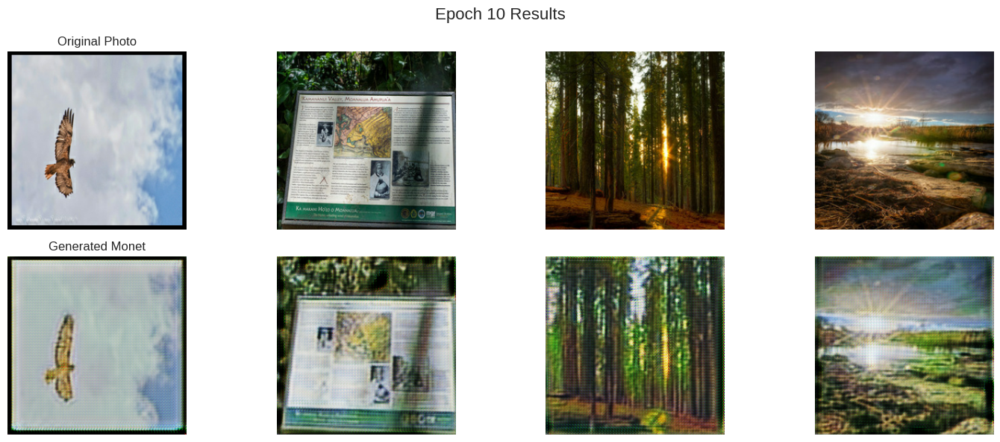

Epoch 11/50, Step 0/100, Gen G: 4.4654, Gen F: 4.1413, Disc X: 0.1926, Disc Y: 0.1752
Epoch 11/50, Step 50/100, Gen G: 4.3312, Gen F: 4.3369, Disc X: 0.2487, Disc Y: 0.2635

Epoch 11 completed in 0:01:56.946914
Average losses - Gen G: 4.1850, Gen F: 4.1489, Disc X: 0.2173, Disc Y: 0.2023

Epoch 12/50, Step 0/100, Gen G: 4.0701, Gen F: 3.7428, Disc X: 0.2107, Disc Y: 0.1167
Epoch 12/50, Step 50/100, Gen G: 4.0765, Gen F: 4.1327, Disc X: 0.1765, Disc Y: 0.1954

Epoch 12 completed in 0:02:22.272133
Average losses - Gen G: 4.2909, Gen F: 4.2774, Disc X: 0.2523, Disc Y: 0.1986

Epoch 13/50, Step 0/100, Gen G: 4.4005, Gen F: 4.0679, Disc X: 0.1571, Disc Y: 0.1531
Epoch 13/50, Step 50/100, Gen G: 3.5622, Gen F: 3.5482, Disc X: 0.2662, Disc Y: 0.3490

Epoch 13 completed in 0:01:56.621973
Average losses - Gen G: 4.2046, Gen F: 4.1134, Disc X: 0.1954, Disc Y: 0.1862

Epoch 14/50, Step 0/100, Gen G: 3.6695, Gen F: 3.5486, Disc X: 0.1463, Disc Y: 0.2086
Epoch 14/50, Step 50/100, Gen G: 4.4746, Gen

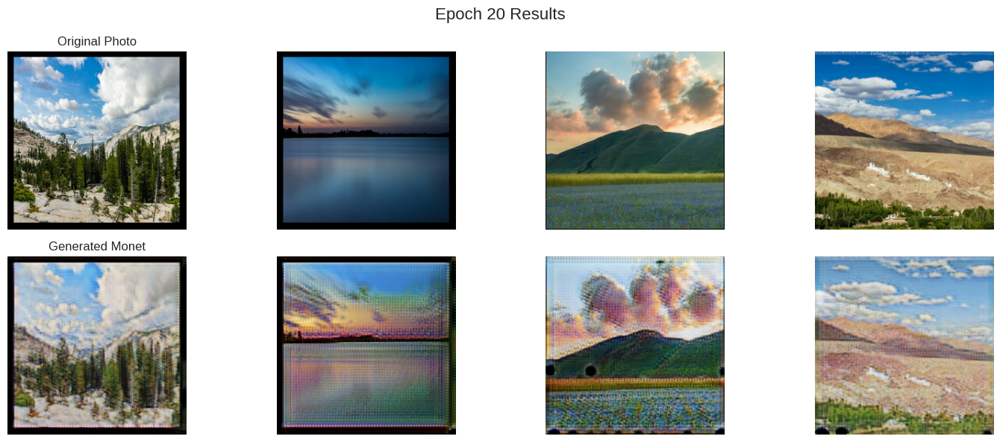

Epoch 21/50, Step 0/100, Gen G: 3.6248, Gen F: 3.4916, Disc X: 0.1436, Disc Y: 0.1467
Epoch 21/50, Step 50/100, Gen G: 3.6814, Gen F: 3.9687, Disc X: 0.1978, Disc Y: 0.1750

Epoch 21 completed in 0:01:56.460385
Average losses - Gen G: 4.0218, Gen F: 3.9394, Disc X: 0.1985, Disc Y: 0.1754

Epoch 22/50, Step 0/100, Gen G: 4.5146, Gen F: 4.0763, Disc X: 0.2310, Disc Y: 0.2077
Epoch 22/50, Step 50/100, Gen G: 3.1443, Gen F: 3.0756, Disc X: 0.1906, Disc Y: 0.1105

Epoch 22 completed in 0:01:56.573016
Average losses - Gen G: 3.8761, Gen F: 3.7546, Disc X: 0.1980, Disc Y: 0.1580

Epoch 23/50, Step 0/100, Gen G: 4.3744, Gen F: 4.2984, Disc X: 0.1437, Disc Y: 0.1313
Epoch 23/50, Step 50/100, Gen G: 4.1328, Gen F: 3.4230, Disc X: 0.2143, Disc Y: 0.1797

Epoch 23 completed in 0:02:22.308389
Average losses - Gen G: 3.9853, Gen F: 3.8726, Disc X: 0.1982, Disc Y: 0.1611

Epoch 24/50, Step 0/100, Gen G: 4.0183, Gen F: 3.5506, Disc X: 0.2386, Disc Y: 0.2210
Epoch 24/50, Step 50/100, Gen G: 3.2882, Gen

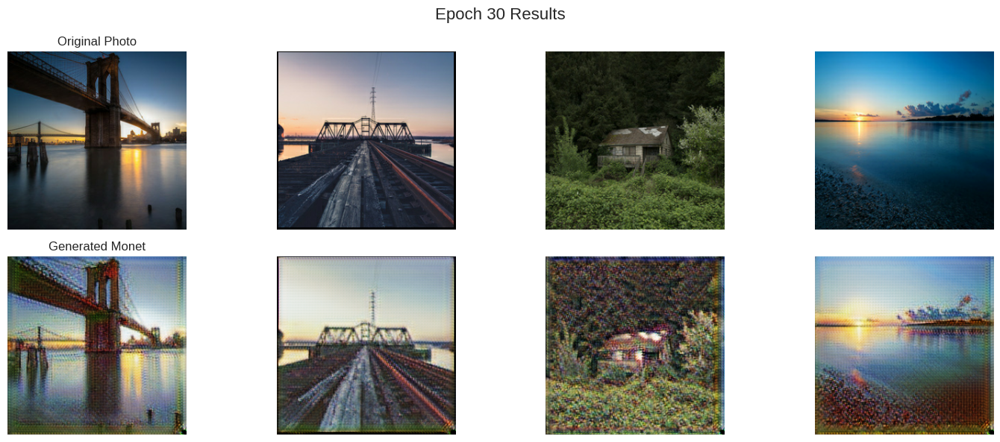

Epoch 31/50, Step 0/100, Gen G: 3.5108, Gen F: 3.7228, Disc X: 0.1525, Disc Y: 0.2104
Epoch 31/50, Step 50/100, Gen G: 3.0980, Gen F: 3.1923, Disc X: 0.1591, Disc Y: 0.1711

Epoch 31 completed in 0:01:56.407566
Average losses - Gen G: 3.5072, Gen F: 3.3973, Disc X: 0.2091, Disc Y: 0.1764

Epoch 32/50, Step 0/100, Gen G: 3.7272, Gen F: 3.3646, Disc X: 0.2320, Disc Y: 0.1332
Epoch 32/50, Step 50/100, Gen G: 3.4476, Gen F: 3.8836, Disc X: 0.2166, Disc Y: 0.1977

Epoch 32 completed in 0:01:56.586683
Average losses - Gen G: 3.5763, Gen F: 3.4827, Disc X: 0.2052, Disc Y: 0.1814

Epoch 33/50, Step 0/100, Gen G: 3.1623, Gen F: 3.1017, Disc X: 0.1437, Disc Y: 0.1577
Epoch 33/50, Step 50/100, Gen G: 3.3300, Gen F: 3.0003, Disc X: 0.1804, Disc Y: 0.1992

Epoch 33 completed in 0:01:56.606769
Average losses - Gen G: 3.4552, Gen F: 3.3467, Disc X: 0.2045, Disc Y: 0.1658

Epoch 34/50, Step 0/100, Gen G: 3.2987, Gen F: 3.2404, Disc X: 0.2802, Disc Y: 0.1257
Epoch 34/50, Step 50/100, Gen G: 3.1415, Gen

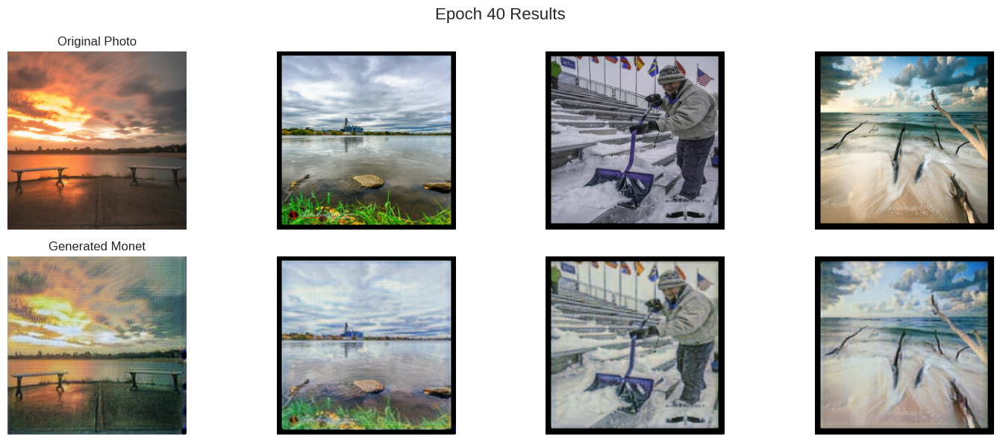

Epoch 41/50, Step 0/100, Gen G: 2.5139, Gen F: 2.6032, Disc X: 0.2503, Disc Y: 0.2750
Epoch 41/50, Step 50/100, Gen G: 3.2636, Gen F: 3.2131, Disc X: 0.2397, Disc Y: 0.1990

Epoch 41 completed in 0:01:56.457046
Average losses - Gen G: 2.8830, Gen F: 3.1254, Disc X: 0.5098, Disc Y: 0.2268

Epoch 42/50, Step 0/100, Gen G: 3.6049, Gen F: 3.5669, Disc X: 0.2214, Disc Y: 0.2032
Epoch 42/50, Step 50/100, Gen G: 2.9239, Gen F: 2.7510, Disc X: 0.2193, Disc Y: 0.1718

Epoch 42 completed in 0:01:56.321211
Average losses - Gen G: 2.8199, Gen F: 2.7345, Disc X: 0.2450, Disc Y: 0.2094

Epoch 43/50, Step 0/100, Gen G: 2.4526, Gen F: 2.5857, Disc X: 0.3049, Disc Y: 0.2858
Epoch 43/50, Step 50/100, Gen G: 2.8378, Gen F: 2.5885, Disc X: 0.2391, Disc Y: 0.2599

Epoch 43 completed in 0:01:56.722512
Average losses - Gen G: 2.8312, Gen F: 2.7148, Disc X: 0.2421, Disc Y: 0.1940

Epoch 44/50, Step 0/100, Gen G: 3.0610, Gen F: 2.8271, Disc X: 0.2522, Disc Y: 0.1585
Epoch 44/50, Step 50/100, Gen G: 3.8724, Gen

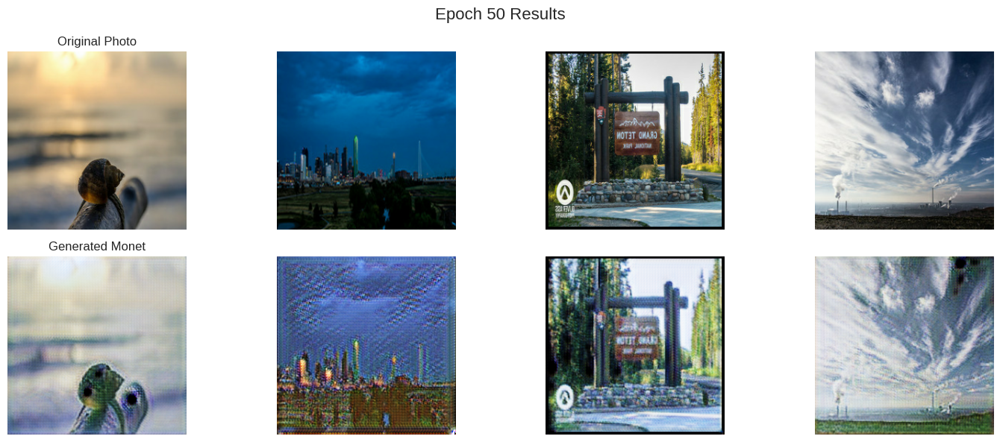


Training completed in 1:39:32.194233


In [16]:
# Distributed training step
@tf.function
def distributed_train_step(dist_inputs):
    per_replica_losses = strategy.run(train_step, args=dist_inputs)
    return {k: strategy.reduce(tf.distribute.ReduceOp.MEAN, v, axis=None) 
            for k, v in per_replica_losses.items()}

# Training history
history = {
    'gen_G_loss': [],
    'gen_F_loss': [],
    'disc_X_loss': [],
    'disc_Y_loss': [],
    'cycle_loss': []
}

# Create distributed datasets
dist_monet_dataset = strategy.experimental_distribute_dataset(monet_dataset)
dist_photo_dataset = strategy.experimental_distribute_dataset(photo_dataset)

# Training loop
print("Starting training...")
start_time = datetime.now()

for epoch in range(config.EPOCHS):
    epoch_start = datetime.now()
    
    # Initialize epoch losses
    epoch_losses = {k: [] for k in history.keys()}
    
    # Train for one epoch
    for step, (monet_batch, photo_batch) in enumerate(zip(dist_monet_dataset, dist_photo_dataset)):
        if step >= config.STEPS_PER_EPOCH:
            break
            
        losses = distributed_train_step((photo_batch, monet_batch))
        
        # Record losses
        for k, v in losses.items():
            epoch_losses[k].append(v)
        
        # Print progress
        if step % 50 == 0:
            print(f"Epoch {epoch+1}/{config.EPOCHS}, Step {step}/{config.STEPS_PER_EPOCH}, "
                  f"Gen G: {losses['gen_G_loss']:.4f}, Gen F: {losses['gen_F_loss']:.4f}, "
                  f"Disc X: {losses['disc_X_loss']:.4f}, Disc Y: {losses['disc_Y_loss']:.4f}")
    
    # Record epoch average losses
    for k in history.keys():
        history[k].append(np.mean(epoch_losses[k]))
    
    # Print epoch summary
    epoch_time = datetime.now() - epoch_start
    print(f"\nEpoch {epoch+1} completed in {epoch_time}")
    print(f"Average losses - Gen G: {history['gen_G_loss'][-1]:.4f}, "
          f"Gen F: {history['gen_F_loss'][-1]:.4f}, "
          f"Disc X: {history['disc_X_loss'][-1]:.4f}, "
          f"Disc Y: {history['disc_Y_loss'][-1]:.4f}\n")
    
    # Generate sample images every 10 epochs
    if (epoch + 1) % 10 == 0:
        print("Generating sample images...")
        for sample_photo in photo_dataset.take(1):
            n_samples = min(5, config.BATCH_SIZE)
            generated_monet = gen_G(sample_photo[:n_samples], training=False)
            plt.figure(figsize=(15, 6))
            for i in range(n_samples):
                # Original photo
                plt.subplot(2, n_samples, i + 1)
                plt.imshow(denormalize_image(sample_photo[i]))
                plt.axis('off')
                if i == 0:
                    plt.title('Original Photo')
                
                # Generated Monet
                plt.subplot(2, n_samples, i + n_samples + 1)
                plt.imshow(denormalize_image(generated_monet[i]))
                plt.axis('off')
                if i == 0:
                    plt.title('Generated Monet')
            
            plt.suptitle(f'Epoch {epoch+1} Results', fontsize=16)
            plt.tight_layout()
            plt.show()

total_time = datetime.now() - start_time
print(f"\nTraining completed in {total_time}")

### 8.3 Plot Training History

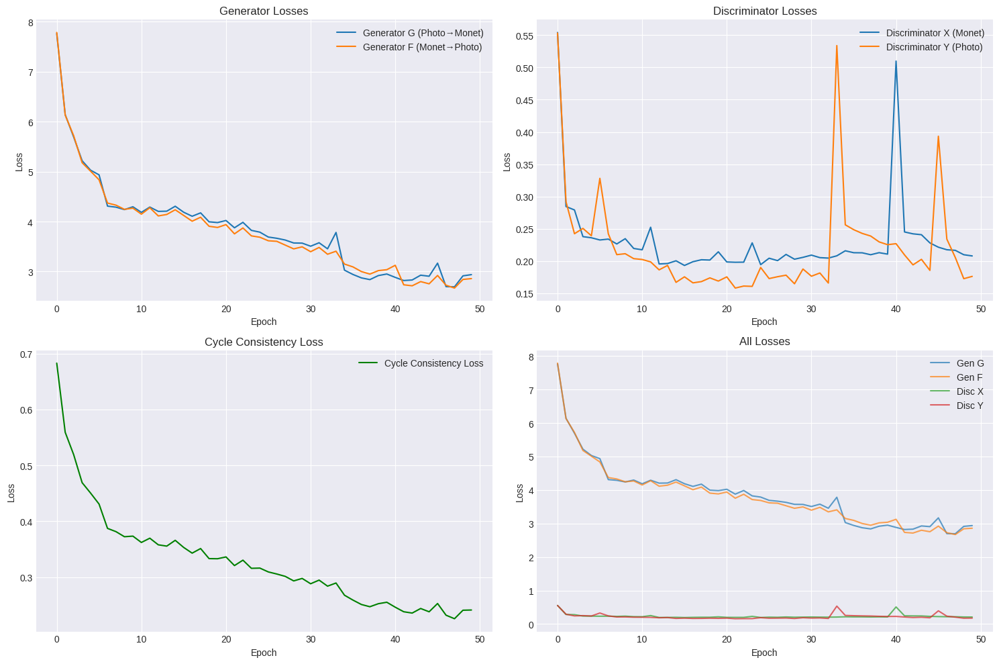

In [17]:
# Plot training history
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Generator losses
axes[0, 0].plot(history['gen_G_loss'], label='Generator G (Photo→Monet)')
axes[0, 0].plot(history['gen_F_loss'], label='Generator F (Monet→Photo)')
axes[0, 0].set_title('Generator Losses')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Loss')
axes[0, 0].legend()
axes[0, 0].grid(True)

# Discriminator losses
axes[0, 1].plot(history['disc_X_loss'], label='Discriminator X (Monet)')
axes[0, 1].plot(history['disc_Y_loss'], label='Discriminator Y (Photo)')
axes[0, 1].set_title('Discriminator Losses')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Loss')
axes[0, 1].legend()
axes[0, 1].grid(True)

# Cycle consistency loss
axes[1, 0].plot(history['cycle_loss'], label='Cycle Consistency Loss', color='green')
axes[1, 0].set_title('Cycle Consistency Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Loss')
axes[1, 0].legend()
axes[1, 0].grid(True)

# Combined view
axes[1, 1].plot(history['gen_G_loss'], label='Gen G', alpha=0.7)
axes[1, 1].plot(history['gen_F_loss'], label='Gen F', alpha=0.7)
axes[1, 1].plot(history['disc_X_loss'], label='Disc X', alpha=0.7)
axes[1, 1].plot(history['disc_Y_loss'], label='Disc Y', alpha=0.7)
axes[1, 1].set_title('All Losses')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Loss')
axes[1, 1].legend()
axes[1, 1].grid(True)

plt.tight_layout()
plt.show()

## 9. Results

### 9.1 Generate Test Images

Generating test images...


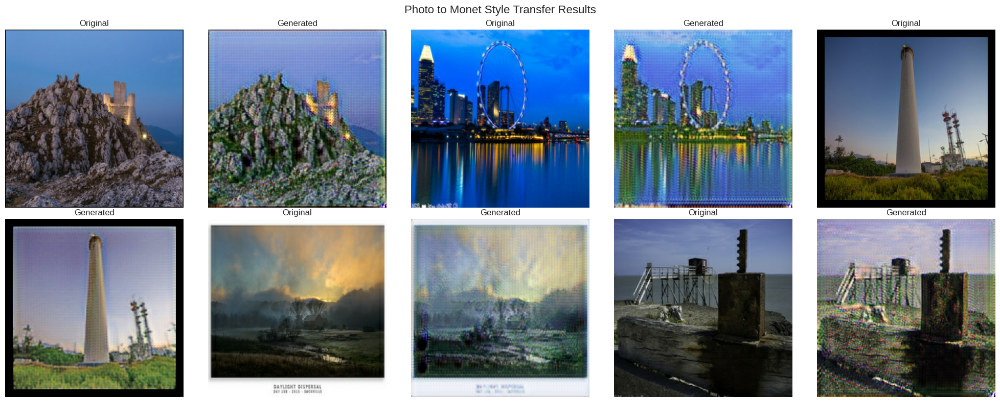

In [18]:
def generate_and_display_images(generator, dataset, n_samples=10, title="Generated Images"):
    """Generate and display images using the trained generator"""
    fig, axes = plt.subplots(2, n_samples//2, figsize=(20, 8))
    axes = axes.flatten()
    
    sample_count = 0
    for batch in dataset.take(n_samples // config.BATCH_SIZE + 1):
        generated = generator(batch, training=False)
        
        for i in range(min(len(generated), n_samples - sample_count)):
            axes[sample_count * 2].imshow(denormalize_image(batch[i]))
            axes[sample_count * 2].set_title('Original')
            axes[sample_count * 2].axis('off')
            
            axes[sample_count * 2 + 1].imshow(denormalize_image(generated[i]))
            axes[sample_count * 2 + 1].set_title('Generated')
            axes[sample_count * 2 + 1].axis('off')
            
            sample_count += 1
            if sample_count >= n_samples//2:
                break
                
        if sample_count >= n_samples//2:
            break
    
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# Generate test images
print("Generating test images...")
generate_and_display_images(gen_G, photo_dataset, n_samples=10, 
                          title="Photo to Monet Style Transfer Results")

### 9.2 Generate Competition Submission

In [19]:
# Create submission directory
import shutil
submission_dir = '/kaggle/working/images'
if os.path.exists(submission_dir):
    shutil.rmtree(submission_dir)
os.makedirs(submission_dir)

# Generate submission images
print(f"Generating {config.OUTPUT_IMAGES} images for submission...")

# Load all photo files for generation
photo_files_all = sorted(tf.io.gfile.glob(config.PHOTO_JPG_PATH))
n_photos = len(photo_files_all)

# Calculate how many times to cycle through photos
n_cycles = config.OUTPUT_IMAGES // n_photos + 1

image_count = 0
batch_photos = []

for cycle in range(n_cycles):
    for photo_path in photo_files_all:
        if image_count >= config.OUTPUT_IMAGES:
            break
            
        # Read and preprocess image
        image = tf.io.read_file(photo_path)
        image = decode_image(image)
        image = normalize_image(image)
        batch_photos.append(image)
        
        # Process batch when full or at the end
        if len(batch_photos) == config.BATCH_SIZE or \
           (image_count + len(batch_photos) >= config.OUTPUT_IMAGES):
            
            batch = tf.stack(batch_photos)
            generated = gen_G(batch, training=False)
            
            # Save generated images
            for i, gen_image in enumerate(generated):
                if image_count >= config.OUTPUT_IMAGES:
                    break
                    
                # Denormalize and convert to uint8
                gen_image = denormalize_image(gen_image)
                gen_image = tf.cast(gen_image * 255, tf.uint8)
                
                # Save image
                filename = f'{submission_dir}/{image_count:05d}.jpg'
                encoded = tf.io.encode_jpeg(gen_image)
                tf.io.write_file(filename, encoded)
                
                image_count += 1
                
                if image_count % 1000 == 0:
                    print(f"Generated {image_count}/{config.OUTPUT_IMAGES} images")
            
            batch_photos = []
    
    if image_count >= config.OUTPUT_IMAGES:
        break

print(f"\nGenerated {image_count} images successfully!")

# Verify submission
submission_files = tf.io.gfile.glob(f'{submission_dir}/*.jpg')
print(f"Submission directory contains {len(submission_files)} images")

Generating 10000 images for submission...
Generated 1000/10000 images
Generated 2000/10000 images
Generated 3000/10000 images
Generated 4000/10000 images
Generated 5000/10000 images
Generated 6000/10000 images
Generated 7000/10000 images
Generated 8000/10000 images
Generated 9000/10000 images
Generated 10000/10000 images

Generated 10000 images successfully!
Submission directory contains 10000 images


In [20]:
import zipfile

def zip_directory(folder_path, zip_path):
    """
    Zips the contents of folder_path into a zip file at zip_path.

    Args:
        folder_path (str): The path to the folder to zip.
        zip_path (str): The output path for the zip file.
    """
    with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for root, dirs, files in os.walk(folder_path):
            for file in files:
                full_path = os.path.join(root, file)
                # Preserve folder structure
                arcname = os.path.relpath(full_path, folder_path)
                zipf.write(full_path, arcname)

zip_directory('/kaggle/working/images', '/kaggle/working/images.zip')

### 9.3 Visualize Final Results

**TO BE COMPLETED AFTER TRAINING**:
- [ ] Describe the quality of generated Monet-style images
- [ ] Note any artifacts or issues in the generated images
- [ ] Compare different epochs to show improvement over time
- [ ] Identify which types of photos work best/worst for style transfer

## 10. Model Evaluation

### 10.1 Qualitative Evaluation

**TO BE COMPLETED AFTER RESULTS**:
- [ ] Assess how well the model captures Monet's color palette
- [ ] Evaluate the brushstroke-like effects in generated images
- [ ] Check for preservation of content/structure from original photos
- [ ] Note any mode collapse or lack of diversity in outputs

### 10.2 Save Models

In [21]:
# Save trained models
model_dir = '/kaggle/working/models'
os.makedirs(model_dir, exist_ok=True)

# Save generators
gen_G.save(f'{model_dir}/generator_photo_to_monet.h5')
gen_F.save(f'{model_dir}/generator_monet_to_photo.h5')

# Save discriminators
disc_X.save(f'{model_dir}/discriminator_monet.h5')
disc_Y.save(f'{model_dir}/discriminator_photo.h5')

print("Models saved successfully!")

Models saved successfully!


## 11. Discussion and Conclusion

### 11.1 Key Findings

**TO BE COMPLETED AFTER FULL ANALYSIS**:
- [ ] Summarize the effectiveness of CycleGAN for this task
- [ ] Discuss the impact of different hyperparameters (cycle loss weight, identity loss, etc.)
- [ ] Note the training stability and any challenges encountered
- [ ] Compare results with expected outcomes based on literature

### 11.2 Challenges Encountered

**TO BE COMPLETED**:
- [ ] Dataset imbalance (300 Monet vs 7,028 photos) and its impact
- [ ] Training stability issues and how they were addressed
- [ ] Computational requirements and TPU utilization
- [ ] Any mode collapse or other GAN-specific problems

### 11.3 Potential Improvements

**TO BE COMPLETED**:
- [ ] Architectural modifications that could improve results
- [ ] Data augmentation strategies to address imbalance
- [ ] Different loss functions or weights to explore
- [ ] Post-processing techniques for better image quality

### 11.4 Kaggle Competition Results

**TO BE COMPLETED AFTER SUBMISSION**:
- [ ] Include screenshot of Kaggle leaderboard position
- [ ] Report final MiFID score achieved
- [ ] Compare performance with other participants
- [ ] Discuss what strategies led to this performance

### 11.5 Learning Outcomes

**TO BE COMPLETED**:
- [ ] Technical skills gained (GANs, TPU usage, TensorFlow)
- [ ] Understanding of artistic style transfer
- [ ] Experience with unpaired image-to-image translation
- [ ] Insights into GAN training challenges and solutions

## 12. References

1. Zhu, J. Y., Park, T., Isola, P., & Efros, A. A. (2017). Unpaired image-to-image translation using cycle-consistent adversarial networks. In Proceedings of the IEEE international conference on computer vision (pp. 2223-2232).

2. Kaggle Competition: I'm Something of a Painter Myself. https://www.kaggle.com/competitions/gan-getting-started

3. TensorFlow CycleGAN Tutorial. https://www.tensorflow.org/tutorials/generative/cyclegan

4. Instance Normalization: The Missing Ingredient for Fast Stylization. Ulyanov, D., Vedaldi, A., & Lempitsky, V. (2016).

---

**GitHub Repository**: [INSERT YOUR REPO URL HERE]  
**Kaggle Notebook**: [INSERT KAGGLE NOTEBOOK URL HERE]